<h1 align="center">Volume 2: The Fourier Transform.</h1>

    Maxwell Nielsen
    Section 001
    12/8/2021

<h2 align="center">Part 1: The Discrete Fourier Transform</h2>

In [1]:
from matplotlib import pyplot as plt
from scipy.io import wavfile
import numpy as np
import IPython
import scipy
from scipy.fftpack import fft, ifft
import math
from scipy import signal
import imageio
from scipy.fftpack import fft2, ifft2

In [2]:
plt.rcParams["figure.dpi"] = 300            # Fix plot quality.
plt.rcParams["figure.figsize"] = (12,3)      # Change plot size / aspect (you may adjust this).

In [3]:
class SoundWave(object):
    """A class for working with digital audio signals."""

    # Problem 1.1
    def __init__(self, rate, samples):
        """Set the SoundWave class attributes.

        Parameters:
            rate (int): The sample rate of the sound.
            samples ((n,) ndarray): NumPy array of samples.
        """
        self.rate = rate      #save the rate and samples of the audio as attributes
        self.samples = samples

    # Problems 1.1 and 1.7
    def plot(self, display_dft=False):
        """Plot the graph of the sound wave (time versus amplitude)."""
            
        length = len(self.samples) / rate   #calculate the duration of the audio
        
        x = np.linspace(0, length, len(self.samples))   #create our domain of seconds with the amount of subintervals the number of samples
        
        plt.subplot(211)      #plot the samples against the time
        plt.plot(x, self.samples, 'b-')
        plt.xlabel("Seconds")
        plt.ylabel("Samples")
        plt.ylim(-32768, 32768)  #set the y limit according to the 62 bit integer form
        
        if display_dft:
            y = np.arange(0, len(self.samples))*self.rate / len(self.samples)  #create our domain in hertz using the formula 1.7
            dft = np.abs(scipy.fftpack.fft(self.samples))   #find the magnitudes of fourier transformation of the sample
            plt.subplot(212)
            plt.plot(y[:(len(self.samples))//2], dft[:(len(self.samples))//2], 'r-', linewidth=.4)  #only plot half to avoid repeats
            plt.xlabel("Frequency(Hz)")
            plt.ylabel("Magnitude")
        
        plt.tight_layout()
        plt.show()

    # Problem 1.2
    def export(self, filename, force=False):
        """Generate a wav file from the sample rate and samples. 
        If the array of samples is not of type np.int16, scale it before exporting.

        Parameters:
            filename (str): The name of the wav file to export the sound to.
        """
        
        if force or type(self.samples[0]) != np.int16:  #scale the samples if forced to, if not the correct type
            scaled_samples = np.int16((self.samples.real/np.max(np.abs(self.samples))) * 32767)
            wavfile.write(filename, self.rate, scaled_samples)   
        else:
            wavfile.write(filename, self.rate, self.samples)   #write the SoundWave object to the given file name
            
    
    # Problem 1.4
    def __add__(self, other):
        """Combine the samples from two SoundWave objects.

        Parameters:
            other (SoundWave): An object containing the samples to add
                to the samples contained in this object.
        
        Returns:
            (SoundWave): A new SoundWave instance with the combined samples.

        Raises:
            ValueError: if the two sample arrays are not the same length.
        """
        if len(self.samples) != len(other.samples):  #raise error if sample lengths are different
            raise ValueError("The two SoundWave arrays are not the same length")
        
        new_SoundWave = SoundWave(self.rate, self.samples + other.samples)  #add the samples element wise
        
        return new_SoundWave

    # Problem 1.4
    def __rshift__(self, other):
        """Concatentate the samples from two SoundWave objects.

        Parameters:
            other (SoundWave): An object containing the samples to concatenate
                to the samples contained in this object.

        Raises:
            ValueError: if the two sample rates are not equal.
        """
        if self.rate != other.rate:  #raise an error if the rates of the objects are different
            raise ValueError("The two objects must have the same rate")
        
        new_wave = SoundWave(self.rate, np.concatenate((self.samples, other.samples)))  #concatenate the samples
        
        return new_wave
    
    # Problem 2.1
    def __mul__(self, other):
        """Convolve the samples from two SoundWave objects using circular convolution.
        
        Parameters:
            other (SoundWave): An object containing the samples to convolve
                with the samples contained in this object.
        
        Returns:
            (SoundWave): A new SoundWave instance with the convolved samples.

        Raises:
            ValueError: if the two sample rates are not equal.
        """
        if self.rate != other.rate:
            raise ValueError("The two samples rates are not equal")    #raise error if the sample rates are different
            
        len_self = len(self.samples)           #calculate the sample size of each
        len_other = len(other.samples)
        
        if len_self > len_other:            #add zeros to smaller array of samples so they are the same size
            compensate = len_self - len_other
            other.samples = np.append(other.samples, np.zeros(compensate))
                
        if len_other > len_self:
            compensate1 = len_other - len_self
            self.samples = np.append(self.samples, np.zeros(compensate1))
                
        convo_samples = ifft((fft(self.samples)) * (fft(other.samples))).real     #take the convolution of the samples
        
        new_sound = SoundWave(self.rate, convo_samples)       #create a new soundwave object with same rate and samples being the convolution
        
        return new_sound
            
    # Problem 2.2
    def __pow__(self, other):
        """Convolve the samples from two SoundWave objects using linear convolution.
        
        Parameters:
            other (SoundWave): An object containing the samples to convolve
                with the samples contained in this object.
        
        Returns:
            (SoundWave): A new SoundWave instance with the convolved samples.

        Raises:
            ValueError: if the two sample rates are not equal.
            
        """
        if self.rate != other.rate:
            raise ValueError("The two samples rates are not equal")    #raise error if the sample rates are different
            
        len_self = len(self.samples)           #calculate the sample size of each
        len_other = len(other.samples)
        
        we_need = len_self + len_other - 1
        
        power_list = []
        i = 0
        while 2**i < we_need:
            power_list.append(i)
            i+=1
        needed_power = power_list[len(power_list) -1] + 1
        
        entries_needed = 2 ** needed_power  #find 2 to the smallest power that is greater than or equal to the number of samples needed 
        
        self_comp = entries_needed - len(self.samples)        #calculate how many zeroes we need to add to each
        
        other_comp = entries_needed - len(other.samples)
        
        self.samples = np.append(self.samples, np.zeros(self_comp))     #add the appropriate amount of zeroes
        
        other.samples = np.append(other.samples, np.zeros(other_comp))
        
        convo = ifft((fft(self.samples)) * (fft(other.samples))).real   #take the convolution
        
        final = convo[:we_need]    #return only the amount of samples that we need
        
        return SoundWave(self.rate, final)
    
        
        
            
        
    # Problem 2.4
    def clean(self, low_freq, high_freq):
        """Remove a range of frequencies from the samples using the DFT. 

        Parameters:
            low_freq (float): Lower bound of the frequency range to zero out.
            high_freq (float): Higher boound of the frequency range to zero out.
        """
        dft = fft(self.samples)        #take the dft of the samples
        
        k_low = low_freq * len(self.samples) // self.rate   #find the integer indices corresponding to the frequencies
        k_high = high_freq * len(self.samples) // self.rate
        
        dft[k_low:k_high] = 0       #set the entries equal to zero at the corresponding indices
        
        dft[-k_high:-k_low] = 0
        
        return ifft(dft).real                 #return the real parts of the inverse dft 
            
        

### Problem 1.1

- Implement `SoundWave.__init__()`.
- Implement `SoundWave.plot()`.
- Use the `scipy.io.wavfile.read()` and the `SoundWave` class to plot `tada.wav`.

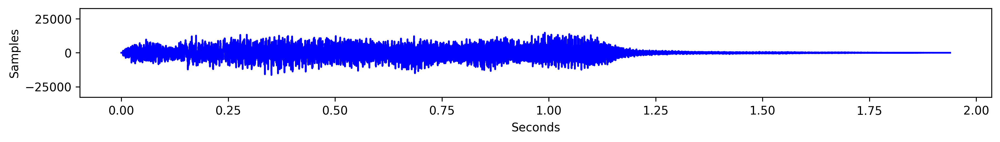

In [4]:
rate, samples = wavfile.read("tada.wav")   #find the rate and samples from the tada audio
soundwave = SoundWave(rate, samples)  #create a SoundWave object out of this rate and samples
soundwave.plot()   #use the plot method to graph the audio

### Problem 1.2

- Implement `SoundWave.export()`.
- Use the `export()` method to create two new files containing the same sound as `tada.wav`: one without scaling, and one with scaling (use `force=True`).
- Use `IPython.display.Audio()` to embed the original and new versions of `tada.wav` in the notebook.

In [5]:
IPython.display.Audio(filename='tada.wav') #display the audio of the tada audio

In [6]:
soundwave.export('non_scaled.wav', force=False)
IPython.display.Audio(filename='non_scaled.wav')  #display the audio of our derived SoundWave object

In [7]:
soundwave.export('scaled.wav', force=True)
IPython.display.Audio(filename='scaled.wav') #display the scaled audio of our derived SoundWave object 

### Problem 1.3

- Implement `generate_note()`.
- Use `generate_note()` to create an A tone that lasts for two seconds. Embed it in the notebook.

In [8]:
def generate_note(frequency, duration):
    """Generate an instance of the SoundWave class corresponding to 
    the desired soundwave. Uses sample rate of 44100 Hz.
    
    Parameters:
        frequency (float): The frequency of the desired sound.
        duration (float): The length of the desired sound in seconds.
    
    Returns:
        sound (SoundWave): An instance of the SoundWave class.
    """
    x = np.linspace(0, duration, 44100*duration)   #create our domain up to our time with rate*duration intervals
    f = np.sin(2*np.pi*x*frequency)   #create a periodic function to represent the note with given frequency
    
    our_wave = SoundWave(44100, f)   #create SoundWave object using f as samples and rate of 44100
    
    return our_wave

In [9]:
A = generate_note(440, 2)    #generate A note of two seconds
A.export('A.wav')     
IPython.display.Audio(filename='A.wav')   #write the note to a file and display its audio

### Problem 1.4

- Implement `SoundWave.__add__()`.
- Generate a three-second A minor chord (A, C, and E) and embed it in the notebook.
- Implement `SoundWave.__rshift__()`.
- Generate the arpeggio A$\,\rightarrow\,$C$\,\rightarrow\,$E, where each tone lasts one second, and embed it in the notebook.

In [10]:
A_note = generate_note(440, 3)   #create A, C, and E notes of three seconds each
C_note = generate_note(523.25, 3)
E_note = generate_note(659.25, 3)

A_minor = (A_note + C_note) + E_note   #create an A minor chord by adding the samples element wise

A_minor.export('A_minor.wav') 
IPython.display.Audio(filename='A_minor.wav')    #write the chord to a file and display its audio

In [11]:
A_note1 = generate_note(440, 1)   #create A, C, and E notes of one second each
C_note1 = generate_note(523.25, 1)
E_note1 = generate_note(659.25, 1)

arpeggio = (A_note1 >> C_note1) >> E_note1   #concatenate the notes to create an arpeggio
arpeggio.export('arpeggio.wav')
IPython.display.Audio(filename='arpeggio.wav')   #write the arpeggio to a file and display its audio

### Problem 1.5

- Implement `simple_dft()` with the formula $c=F_nf$, where $F_n$ is the n-dimensional DFT matrix.
- Use `np.allclose()` to check that `simple_dft()` and `scipy.fftpack.fft()` give the same result (after scaling).

In [12]:
def simple_dft(samples):
    """Compute the DFT of an array of samples.

    Parameters:
        samples ((n,) ndarray): an array of samples.
    
    Returns:
        ((n,) ndarray): The DFT of the given array.
    """
    
    n = len(samples)    #get the amount of samples
    m = np.arange(n).reshape(n,1)   
    W = np.exp((-2*1j * np.pi/n)*m @ m.T)   #create our DFT transition matrix
    return W @ samples / n    #multiply the samples by the transition matrix and divide by the number of samples

In [13]:
r_array = np.random.randint(-32768, 32768, 4, dtype=np.int16)  #generate random int array of length 4
if np.allclose(4*simple_dft(r_array), scipy.fftpack.fft(r_array)):   #make sure both methods produce same dft
    print("Success")
    
r_array1 = np.random.randint(-32768, 32768, 8, dtype=np.int16)  #generate random int array of length 8
if np.allclose(8*simple_dft(r_array1), scipy.fftpack.fft(r_array1)):  #make sure both methods produce same dft
    print("More success")

Success
More success


### Problem 1.6

- Implement `simple_fft()`.
- Generate an array of $8192$ random samples and take its DFT using `simple_dft()`, `simple_fft()`, and `scipy.fftpack.fft()`.
Print the runtimes of each computation.
- Use `np.allclose()` to check that `simple_fft()` and `scipy.fftpack.fft()` give the same result (after scaling).

In [14]:
def simple_fft(samples, threshold=1):
    """Compute the DFT using the FFT algorithm.
    
    Parameters:
        samples ((n,) ndarray): an array of samples.
        threshold (int): when a subarray of samples has fewer
            elements than this integer, use simple_dft() to
            compute the DFT of that subarray.
    
    Returns:
        ((n,) ndarray): The DFT of the given array.
    """
    f = samples
    N = threshold
    def Split(g):
        n = len(g)
        if n <= N:
            return n * simple_dft(g)  #Use the function from Problem 5 for small enough g
        else:
            even = Split(g[::2])  #Get the DFT of every other entry of g, starting from 0.
            odd = Split(g[1::2])  #Get the DFT of every other entry of g, starting from 1.
            z = np.zeros(n).astype(complex)
            
            for k in range(n):   #Calculate the exponential parts of the sum.
                z[k] = np.exp(-2*np.pi*1j*k/n)
            m = n//2  #Get the middle index for z
            
            return np.hstack([even+z[:m]*odd, even+z[m:]*odd])   #Concatenate two arrays of length m
        
    return Split(f) / len(f)

In [15]:
ra_array = np.random.randint(-32768, 32768, 4, dtype=np.int16)  #generate random int array of length 4
if np.allclose(4*simple_fft(ra_array), scipy.fftpack.fft(ra_array)):  #make sure both methods produce same dft
    print("Success")
    
ra_array1 = np.random.randint(-32768, 32768, 8, dtype=np.int16)   #generate random int array of length 8
if np.allclose(8*simple_fft(ra_array1), scipy.fftpack.fft(ra_array1)):  #make sure both methods produce same dft
    print("More success")  
    
spec_array = np.random.randint(-32768, 32768, 8192, dtype=np.int16)  #create rand int array of length 8192

%time simple_dft(spec_array)   #time each method finding the dft
%time simple_fft(spec_array)
%time scipy.fftpack.fft(spec_array)

Success
More success
CPU times: user 3.09 s, sys: 1.44 s, total: 4.54 s
Wall time: 3.61 s
CPU times: user 325 ms, sys: 7.58 ms, total: 333 ms
Wall time: 331 ms
CPU times: user 305 µs, sys: 118 µs, total: 423 µs
Wall time: 248 µs


array([ 2225323.             -0.j        ,
       -1289349.38028488-403151.8232794j ,
       -2471023.7755677 -405360.28756989j, ...,
         911555.14625397+316227.02181758j,
       -2471023.7755677 +405360.28756989j,
       -1289349.38028488+403151.8232794j ])

### Problem 1.7

- Modify `SoundWave.plot()` so that it accepts a boolean. When the boolean is `True`, take the DFT of the stored samples and plot (in a new subplot) the frequencies present on the $x$-axis and the magnituds of those frequences on the $y$-axis. Only the display the first half of the plot, and adjust the $x$-axis so that it correctly shows the frequencies in Hertz.
- Display the plot of the DFT of an A tone.
- Display the plot of the DFT of an A minor chord.

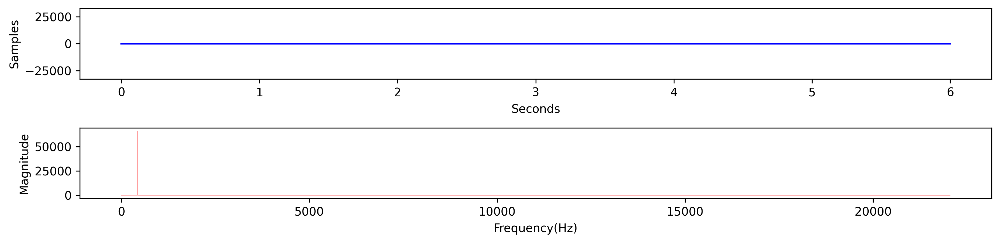

In [16]:
A_note.plot(True)   #plot the A note and its dft

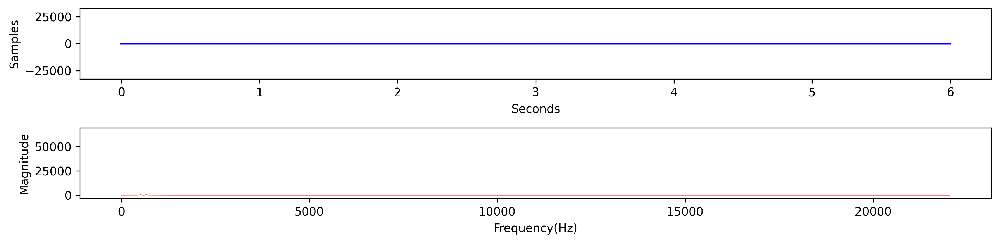

In [17]:
A_minor.plot(True)  #plot the A minor chord and its dft

### Problem 1.8

Use the DFT to determine the individual notes that are present in `mystery_chord.wav`.

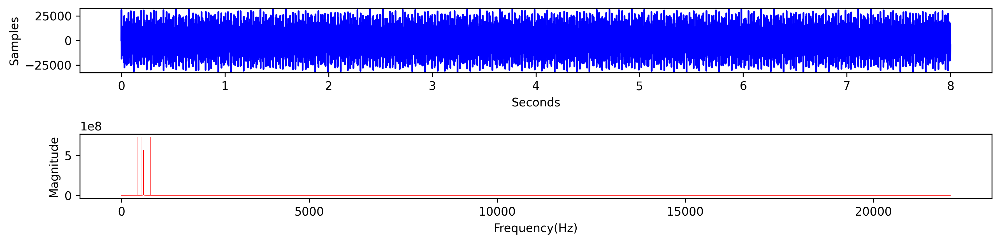

In [18]:
rate1, samples1 = wavfile.read("mystery_chord.wav")  #get the rate and samples of the mystery chord
mystery = SoundWave(rate1, samples1)   #create SoundWave object from the data
mystery.plot(True)  #plot mystery chord and its dft to see that there are four notes in the chord

In [19]:
mystery_dft = scipy.fftpack.fft(samples1)  #find the dft of the samples of the mystery chord
mystery_dft = np.abs(mystery_dft[:len(samples1)//2])  #keep the magnitude of the first half of the samples to avoid duplicates
largest = np.argsort(mystery_dft)   #sort indices corresponding to the magnitudes
ordered = largest[::-1]    #arrange the indices from largest to smallest magnitudes
big_four = ordered[:4]    #get the indices corresponding to the four biggest magnitudes
print(big_four*rate1/len(samples1))   #use equation 1.7 to find their frequencies and thus the notes they represent

[440.   784.   523.25 587.5 ]


The notes are A, G, C, and D

<h2 align="center">Part 2: Convolution and Filtering.</h2>

### Problem 2.1

- Implement `SoundWave.__mul__()` for circular convolution.
- Generate 2 seconds of white noise at the same sample rate as `tada.wav`.
- Compute the circular convolution of `tada.wav` and the white noise. Embed the result in the notebook.
- Append the circular convolution to itself and embed the result in the notebook.

In [20]:
rate = 22050
white_noise = np.random.randint(-32767, 32767, rate*2, dtype=np.int16) # Create 2 seconds of white noise at a given rate.
white = SoundWave(rate, white_noise)

rate1, samples = wavfile.read("tada.wav")   #find the rate and samples from the tada audio
tada = SoundWave(rate1, samples)    #create soundwave object from tada rate and samples

convolution = tada * white  #take the convolution

final_product = convolution >> convolution

In [21]:
convolution.export("convo.wav")        #display the convolution
IPython.display.Audio(filename='convo.wav') 

In [22]:
final_product.export('white_convolution.wav')          #display the convolution appended to itself
IPython.display.Audio(filename='white_convolution.wav') 

### Problem 2.2

- Implement `SoundWave.__pow__()` for linear convolution.
- Time the linear convolution of `CGC.wav` and `GCG.wav` using `SoundWave.__pow__()` and `scipy.signal.fftconvolve()`.
- Embed the two original sounds and their convolutions in the notebook. Check that the convolutions with `SoundWave.__pow__()` and `scipy.signal.fftconvolve()` sound the same.

In [23]:
ratec, samplesc = wavfile.read("CGC.wav")    #get the rates and samples of each file
rateg, samplesg = wavfile.read("GCG.wav")

cgc = SoundWave(ratec, samplesc)             #create soundwave objects out of each
gcg = SoundWave(rateg, samplesg)

cgc.export("cgcaudio.wav")
gcg.export("gcgaudio.wav")

IPython.display.Audio(filename='cgcaudio.wav')

In [24]:
IPython.display.Audio(filename='gcgaudio.wav')

In [25]:
%time cgc ** gcg                      #time our and scipy's convolution method
%time scipy.signal.fftconvolve(samplesc, samplesg)

CPU times: user 92.8 ms, sys: 12.3 ms, total: 105 ms
Wall time: 103 ms
CPU times: user 26.2 ms, sys: 757 µs, total: 27 ms
Wall time: 25.9 ms


array([ 3.79259259e-03, -1.42222222e-03,  8.91088001e+06, ...,
       -5.55668563e+08, -2.53623938e+08, -6.74017190e+07])

In [26]:
fftconvolve = SoundWave(ratec, scipy.signal.fftconvolve(samplesc, samplesg))     #embed sound from scipy convolve
fftconvolve.export("fftconvolution.wav")
IPython.display.Audio(filename='fftconvolution.wav')

In [27]:
convolute = cgc ** gcg              #take the convolution of the two audios and display the audio
convolute.export("convolutiongc.wav")
IPython.display.Audio(filename='convolutiongc.wav')

### Problem 2.3

Use `SoundWave.__pow__()` or `scipy.signal.fftconvolve()` to compute the linear convolution of `chopin.wav` and `balloon.wav`.
Embed the two original sounds and their convolution in the notebook.

In [28]:
chopinrate, chopinsamples = wavfile.read("chopin.wav")      #gather the samples and rates from each
balloonrate, balloonsamples = wavfile.read("balloon.wav")

chopin = SoundWave(chopinrate, chopinsamples)
balloonpop = SoundWave(balloonrate, balloonsamples)    #create soundwave objects of each

chopin.export("playchopin.wav")
balloonpop.export("poptheballoon.wav")

IPython.display.Audio(filename='playchopin.wav')

In [29]:
IPython.display.Audio(filename='poptheballoon.wav')

In [30]:
newchopin = chopin ** balloonpop           #take the convolution of the audios and display it
newchopin.export("newchopin.wav")
IPython.display.Audio(filename='newchopin.wav')

### Problem 2.4

- Implement `SoundWave.clean()`.
- Clean `noisy1.wav` by filtering out frequencies from $1250$-$2600$ Hz. Embed the original and the cleaned versions in the notebook.
- Clean `noisy2.wav`. Embed the original and the cleaned versions in the notebook.

In [31]:
n1rate, n1samples = wavfile.read("noisy1.wav")       #get the rates and samples from each noisy file and display
n2rate, n2samples = wavfile.read("noisy2.wav")

n1 = SoundWave(n1rate, n1samples)
n2 = SoundWave(n2rate, n2samples)

n1.export("n1.wav")
IPython.display.Audio(filename='n1.wav')     

In [32]:
n1clean = SoundWave(n1rate, n1.clean(1250, 2600))      #clean up the first file by eliminating noise from given frequencies
n1clean.export("n1clean.wav")
IPython.display.Audio(filename='n1clean.wav')

In [33]:
n2.export("n2.wav")
IPython.display.Audio(filename='n2.wav')          #play the audio of second noisy file

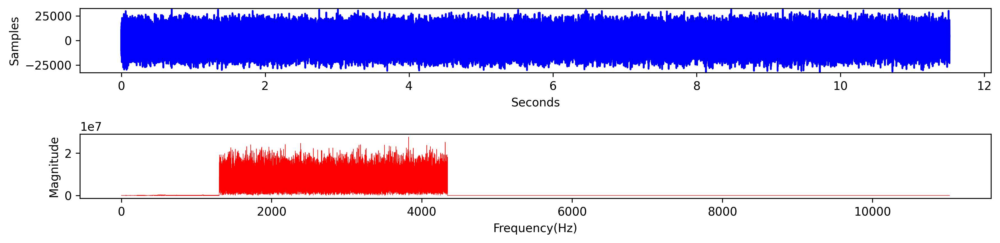

In [34]:
n2.plot(display_dft=True)       #plot the dft of the file to see which frequencies we need to eliminate

In [35]:
n2clean = SoundWave(n2rate, n2.clean(1200, 5000))   #clean up the file at the observed frequencies and display
n2clean.export("n2clean.wav")
IPython.display.Audio(filename='n2clean.wav')

### Problem 2.5

- Clean `vuvuzela.wav` by filtering bad frequencies out of the left and right channels individually.
- Recombine the left and right channels and embed the result in the notebook.

In [36]:
vurate, vusamples = wavfile.read("vuvuzela.wav") #obtain the rate and samples and display audio
with_horns = SoundWave(vurate, vusamples)
with_horns.export("with_horns.wav")
IPython.display.Audio(filename='with_horns.wav')

In [37]:
stereo1 = SoundWave(vurate, vusamples[:, 0])     #get the samples corresponding to each channel
stereo2 = SoundWave(vurate, vusamples[:, 1])

clean_soccer = np.stack((stereo1.clean(200,500), stereo2.clean(200,500)), axis=1) #clean each channel and combine them into one matrix 

final_soccer = SoundWave(vurate, clean_soccer)   #create new soundwave object with cleaned channels and display

final_soccer.export("final_soccer.wav")
IPython.display.Audio(filename='final_soccer.wav')

### Problem 2.6

- Clean up `license_plate.png` so that the year printed on the sticker in the bottom right corner of the plate is legible.
- Display the original and cleaned images.

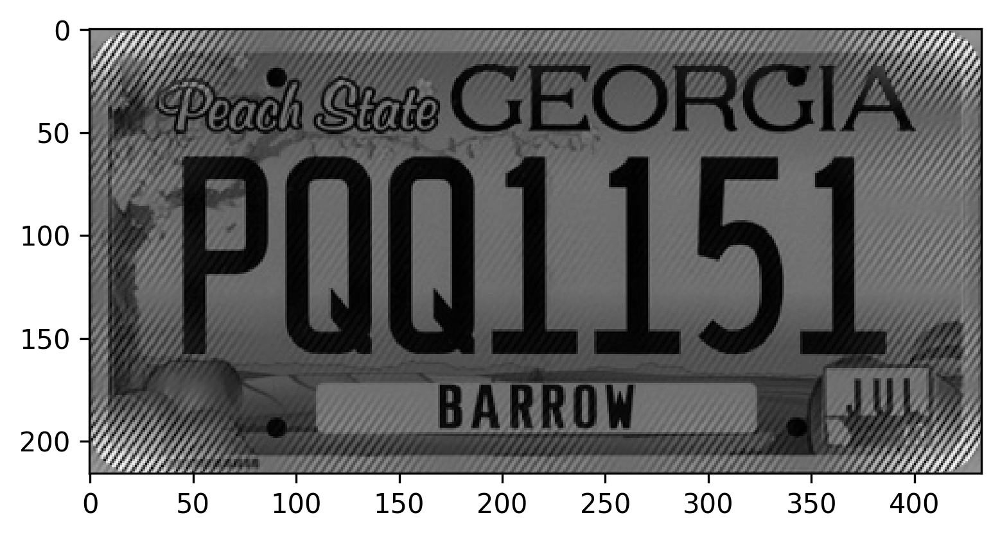

In [38]:
image = imageio.imread("license_plate.png")  #read in the image information in the form of a 2d array and plot
plt.imshow(image, cmap='gray')
plt.show()

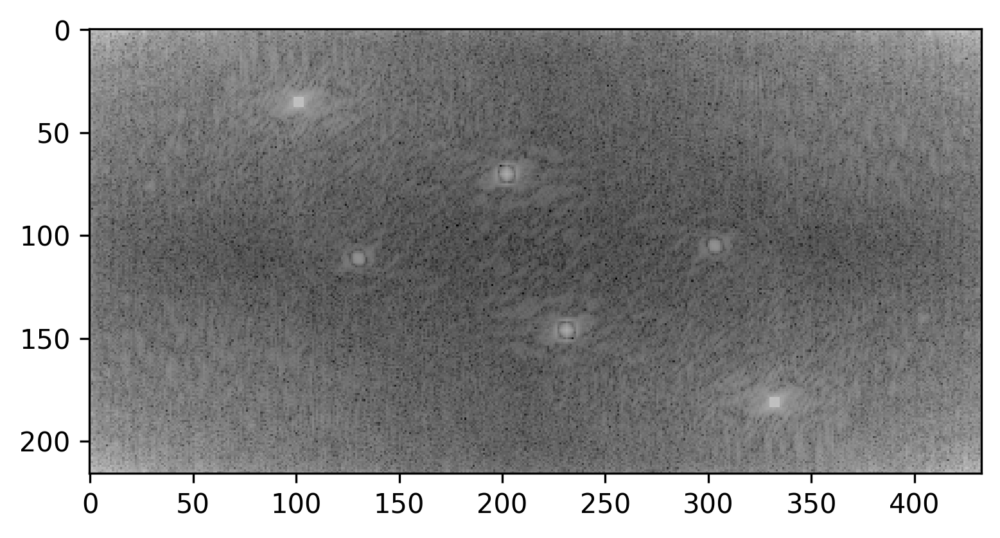

In [39]:
im_dft = fft2(image)   #take the dft of the image and plot it to identify locations of spikes
plt.imshow(np.log(np.abs(im_dft)), cmap="gray")
plt.show()

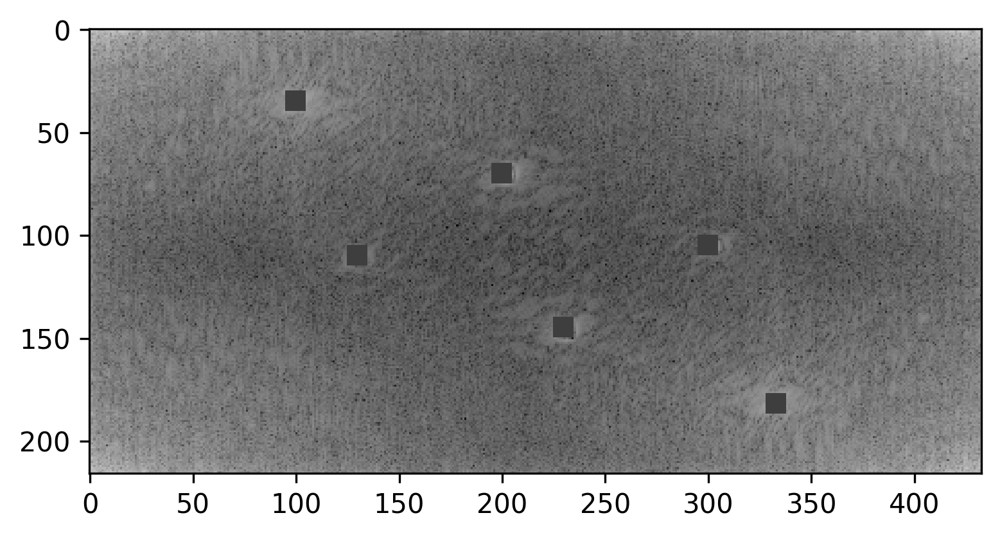

In [40]:
mean = np.mean(im_dft)       #find the mean of the dft
im_dft[30:40, 95:105] = np.ones((10, 10)) * mean  #replace the frequencies at each spike area with the mean
im_dft[177:187, 328:338] = np.ones((10, 10)) * mean
im_dft[105:115, 125:135] = np.ones((10, 10)) * mean
im_dft[65:75, 195:205] = np.ones((10, 10)) * mean
im_dft[140:150, 225:235] = np.ones((10, 10)) * mean
im_dft[100:110, 295:305] = np.ones((10, 10)) * mean
plt.imshow(np.log(np.abs(im_dft)), cmap="gray")     #plot on log scale
plt.show()

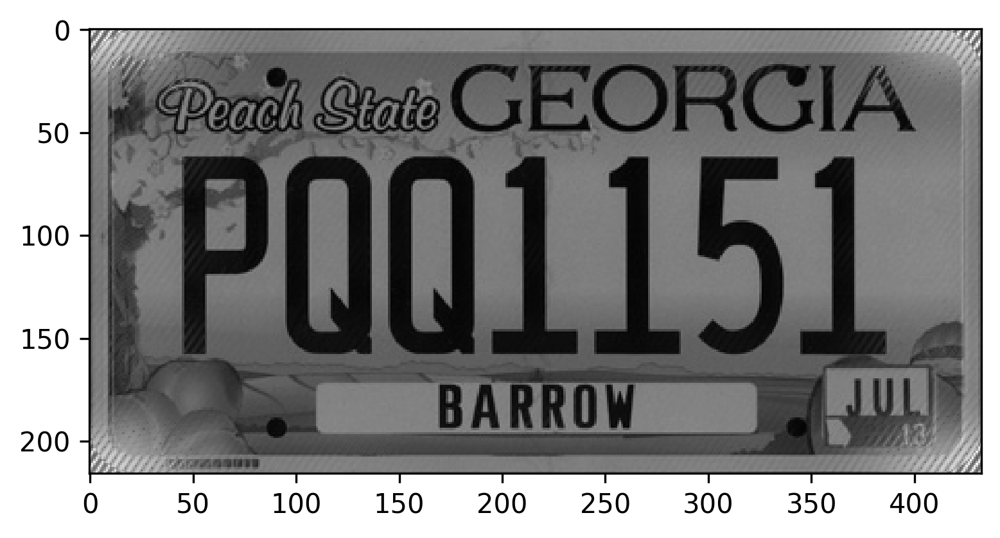

In [41]:
final_im = ifft2(im_dft).real  #take the real parts of the inverse dft of the modified dft and plot
plt.imshow(final_im, cmap='gray')
plt.show()

The year on the sticker is 13